<img src="https://cdn.dal.ca/about-dal/history-tradition/logo-seal/_jcr_content/contentPar/staticimage.adaptive.full.high.png/1654529048363.png" alt="Dalogo" width="200"/>

# CSCI 4144 -  Data Mining and Data Warehousing
# Assignment 4 - Visualization and decision making

**Due:** 5 April 2023, 19h AT

**Your name:** \[Tasneem Hoque\]  
**Your Banner ID:** \[B00841761\]  
**Your NetID:** \[ts562346\]

### Assessment

***!This cell is completed only by your marker!***


| #  | Section       |Mark | Out of  |  Comments |
|----|---------------|-----|---------|-----------|
| 1  | Section 1     |     | / 7    |           |
| 2  | Section 2     |     | / 7    |           |
| 3  | Section 3     |     | / 7    |           |
| 4  | Bonus         |     | / 5    |           |
| -  | TOTAL         |     | / 21    |           |

In [1]:
# import any libraries here
import pandas as pd

# TODO: add any additional libraries here
import seaborn as sns
from matplotlib import pyplot
import plotly.express as px
import plotly.graph_objects as go

# your code should run in Python3

## Section 0 - A fish, a fish, a fishy oh

There are many ways we can use data mining for knowledge and positive societal benefit. So far, we have used healthcare datasets and a political dataset, and now we will wrap up with datasets related to health and the environment, specifically around seafood (as the saying goes, "when in Halifax, do as the Haligonians do").

For this assignment, you have more freedom regarding which data you use and how you will approach their use. There are three datasets from which to choose.

### Datasets

- **per-capita-sources-of-protein.csv** describes the relationship between countries (columns A and B), years (column C), and the amount of grams of protein consumed per day per capita according to different types of food, i.e., plants (column D), meat (E), eggs (F), dairy (G), and seafood (H). This dataset would be appropriate to ask certain questions about health in terms of nutrition. Source: Food and Agriculture Organization of the United Nations
- **fish-stocks-within-sustainable-levels.csv** describes the relationship between countries or regions (columns A and B), years (column C), and the proportion of fish stocks within biologically sustainable levels (not overexploited) (column D) or overexploited (column E). This dataset would be appropriate to ask questions about sustainability. You may wish to extrapolate from the data into the future.  Source: Food and Agriculture Organization of the United Nations. Note: Fish stock are subpopulations of a particular species of fish which have common parameters such as location, growth and mortality which define their population dynamics.
- **environmental-factors.csv** describes the environmental factors for different species of seafood (plus dumb, noisy, stinky chickens as a baseline; column A) across Freshwater use (m3 / kg edible weight; column C),Nitrogen (kgN / t edible weight; column D),Land use (m2 / kg edible weight; column E),and Greenhouse gas emissions (kg / kg edible weight; column F). Note 1: All years are 2021. Note 2: Some species have both wild and farmed subtypes (column A) that you may wish to consider. Data published by Gephart, J. A., Henriksson, P. J., Parker, R. W., Shepon, A., Gorospe, K. D., Bergman, K., ... & Tyedmers, P. (2021). [Environmental performance of blue foods](https://www.nature.com/articles/s41586-021-03889-2). Nature.

Each of the three datasets above were obtained from [Our World In Data](https://ourworldindata.org/fish-and-overfishing), where you can find additional information. You can use `df.head()` to see a sample of the data (including column names), and you can use `df.describe()` to obtain some simple statistics, for Pandas dataframe `df`.

### Tools

You can use any Python library to help you produce visualizations. However, we strongly suggest either:

1. [Seaborn](https://seaborn.pydata.org/),
2. [Matplotlib](https://matplotlib.org/), or
3. [Plotly](https://plotly.com/python/).

It is likely that most CSCI 4144 students would prefer Seaborn. Details of these libraries, including their APIs, examples, and other documentation, are provided in the links above.

### Tasks

You will perform three analyses of your choice (one per Section), using any combination of the datasets above. E.g.,:

- You can use one dataset of your choice for *all* of the following three Sections,
- You can use a unique dataset of your choice for *each* of the following three Sections,
- You can use multiple datasets in any combination of the three following Sections. That is, you can even combine datasets for any Section (if you wish).

Each task/section consists of the following parts:

1. Apply a visualization to your chosen data, 
2. Explain why you chose that visualization and how you considered Bertin's visual variables (e.g., colour, size, shape, or position; see Lec 09),
3. Provide a conclusion from your visualization
4. Provide an explanation as to why your visualization supports that conclusion and any limitations of the data or visualization.

For example, if your data consisted of countries and their geographic areas, your response could be:

1. To sort the data by descending square miles and to draw a bar chart: 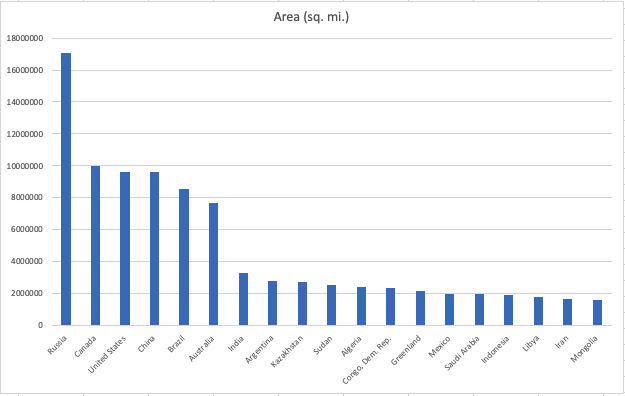
2. Explain that you chose a bar chart because one dimension (country) is nominal and the other (sq. miles) is continuous, and that you sorted them so that you could quickly compare the trend among the largest countries. Explain that you did not change the colour of the bars because there is no variable that would modulate colour that is not already being used.
3. Conclude that, in order for Canada to become the largest country by area, Russia would have to be divided (or to divide itself) into smaller countries no larger than 9,984,670 sq. miles each.
4. Say that this conclusion is supported by the fact that Canada, the 2nd largest country by area, is 9,984,670 sq. miles.

You ***must*** use three distinct *types* of visualization (e.g., bar, line, scatter) across the three Sections. If you repeat a type of visualization in a Section, you risk all marks for that Section.

The meaning of marks are provided in the section descriptions below.

**Hint**: You may want to clean and preprocess your dataset using Python libraries such as Pandas or NumPy and to handle missing values, outliers, or any other issues that might affect the accuracy of your visualization. This is not a _requirement_ but it is recommended _if_ it helps produce more meaningful visualizations.

**Hint**: Consider when it is appropriate to use _relative scales (e.g., percentages) vs absolute scales_. E.g., consider when it might  matter exactly how much seafood someone eats per day in a particular country, versus what proportion of their protein intake comes from seafood.

**Hint**: In your visualizations, be sure to include *all* relevant details, including axis labels, axis titles, visualization title, and any relevant legends for colours or symbols.

**Hint**: Be sure to properly cite your sources, like the scientist that you are.

# Section 1 

In [2]:
# 1. load the dataset and plot a visualization 
#    0 marks: not done
#    1 mark: done, but important information (e.g., legend or labels) is missing
#    2 marks: otherwise

# TODO: your code goes here, below. Be sure to handle potential errors. 
#   

df = pd.read_csv("per-capita-sources-of-protein.csv")

# since the country code is equivalent to counrty and code is missing values, 'code' column is dropped
df.isnull().sum() 
df = df.drop(['Code'], axis=1) 

# renaming some columns because they are too long
df.rename(columns = {'Vegetal Products | 00002903 || Food available for consumption | 0674pc || grams of protein per day per capita':'Vegal', 
                     'Meat, total | 00002943 || Food available for consumption | 0674pc || grams of protein per day per capita':'Meat',
                     'All egg products | 00002744 || Food available for consumption | 0674pc || grams of protein per day per capita':'Egg',
                     'Milk | 00002948 || Food available for consumption | 0674pc || grams of protein per day per capita':'Milk',
                     'Fish and seafood | 00002960 || Food available for consumption | 0674pc || grams of protein per day per capita':'Fish and Seafood'}, inplace = True)

# making sure there are no other null values other than 'Code' column
df.isna().sum()

# melt df into 
dfm = df.melt(
    id_vars=['Entity', 'Year'],
    var_name='FoodType', value_name='Consumption'
)


In [3]:
dfm['FoodType'].unique()

array(['Vegal', 'Meat', 'Egg', 'Milk', 'Fish and Seafood'], dtype=object)

[Text(0, 0.5, 'Year'),
 Text(0.5, 0, 'Food Available For Consumption (0674pc grams of protein per day per capita)'),
 Text(0.5, 1.0, 'Food Available For Consumption In Canada Vs. China')]

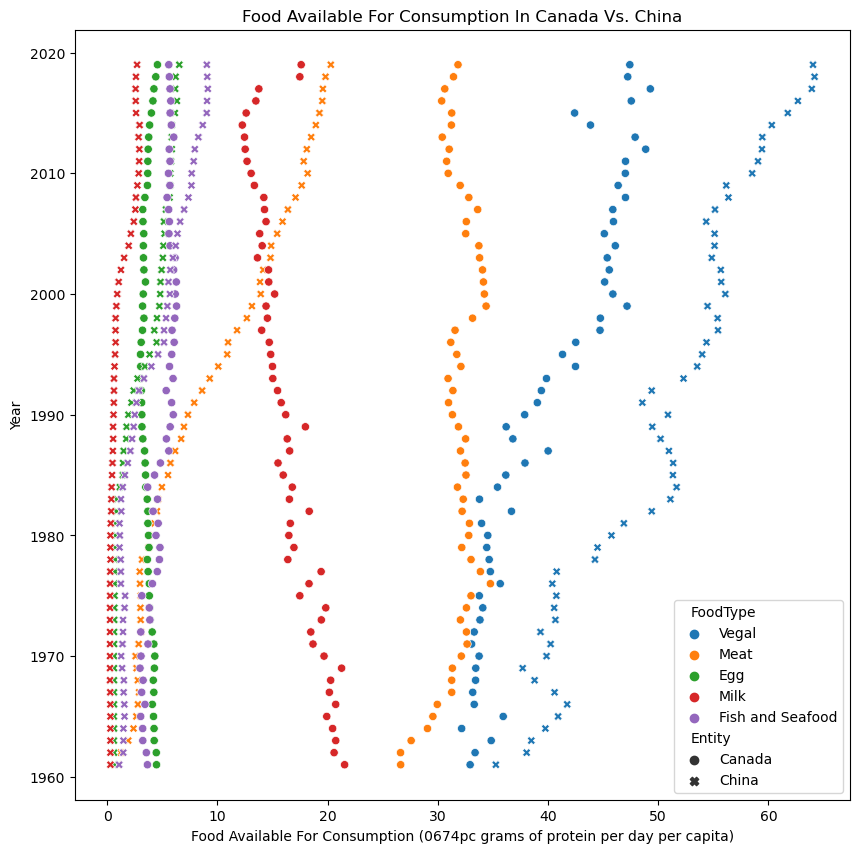

In [4]:
country = dfm.loc[(dfm["Entity"]=="Canada") | (dfm["Entity"]=="China")]
fig, ax = pyplot.subplots(figsize=(10, 10))
plot1 = sns.scatterplot(ax=ax, data=country, x="Consumption", y="Year", hue="FoodType", style="Entity")
plot1.set(ylabel ="Year", xlabel = "Food Available For Consumption (0674pc grams of protein per day per capita)", title ='Food Available For Consumption In Canada Vs. China')

2. In this cell, explain why you chose that visualization and how you considered Bertin's visual variables (see Lec 09). 

- 0 marks: not done
- 1 mark: done, but important information (e.g., aspect of the graph exists without explanation) is missing
- 2 marks: otherwise

**TODO**: your response goes here

**ANS**: I choose to make a scatterplot with hue for each type of food. On the x-axis I have the values that shows the amount of food available for consumption in the country and in the y-axis I have the year for the data. This visualization gives a clear view of the type of food and the amount available for consumtion in the country for each year. The Bertin's visual variable I am utilizing here is Hue for nominal relational (ie. food types - vegal, meat, egg, milk and seafood), I am also using shapes for nominal values which is the country name (ie.'Entity').

3. Provide a conclusion from your visualization

- 0 marks: not done, or conclusion too obvious (e.g., "countries have areas")
- 1 mark: reasonable conclusion

**TODO**: your response goes here

**ANS**: From the visualization I can conclude that Canada's consumption of food types such as vegal, meat, egg, milk, fish and seafood are remained somewhat constant over the years. A similar plot was made for China, here we can see there was a steady increase in all kinds of food types consumption. I can also conclude that between China and Canada, meat and milk consumption is much higher in Canada then it is in China. 

4. Provide an explanation as to why your visualization supports that conclusion and any limitations of the data or visualization.

- 0 marks: not done
- 1 mark: done, but conclusion is not completely derived from visualization
- 2 marks: otherwise

**TODO**: your response goes here

**ANS**: My visualization supports this conclusion because I can see the trends that are given by food consumption of each type of food in each country (ie. country that is selected) per year, this is the data I used to draw the conclusions above. The limitaions in the visualization is that I am not able to view and compare the food consumption in each country, I rather have to make individual visualizations for each comparison because there is too much data to fit into one chart, which makes it more difficult to differentiate between them.

### Assessment for section 1

***!This cell is completed only by your marker!***


| #  | Task          |Mark | Out of  |  Comments |
|----|---------------|-----|---------|-----------|
| 1  | Load & show   |     | / 2     |           |
| 2  | explain graph |     | / 2     |           |
| 3  | conclusion  |     | / 1     |           |
| 4  | relate conclusion to visualization          |     | / 2     |           |
| -  | TOTAL         |     | / 7      |           |


# Section 2 

In [5]:
# 1. load the dataset and plot a visualization 
#    0 marks: not done
#    1 mark: done, but important information (e.g., legend or labels) is missing
#    2 marks: otherwise

# TODO: your code goes here, below. Be sure to handle potential errors. 
#   
   
country_totals = df
country_totals['total_consumption'] = country_totals['Vegal'] + country_totals['Meat'] + country_totals['Egg'] + country_totals['Milk'] + country_totals['Fish and Seafood']
totals_by_country = country_totals.reset_index()[['Entity', 'total_consumption', 'Year']]

fig = px.choropleth(totals_by_country, locations='Entity', locationmode='country names', color='total_consumption', 
                    hover_name='Entity', animation_frame='Year', projection='natural earth')

fig.update_layout(title_text='Food Consumption by Country and Year')

fig.show()

2. In this cell, explain why you chose that visualization and how you considered Bertin's visual variables (see Lec 09). 

- 0 marks: not done
- 1 mark: done, but important information (e.g., aspect of the graph exists without explanation) is missing
- 2 marks: otherwise

**TODO**: your response goes here

**ANS**: This visualization gives a good overall view of the data over the year and the aggregate of food consumption for each country. The year scale on the bottom is interactive and allows us to see the trend overtime. The play and pause button can also be used to see the trend as an animation. The Bertin's visual variables I have used here are position (each value in position of their respective countries) and hue (lighter colors for higher food consumption and darker value for lower food consumption).

3. Provide a conclusion from your visualization

- 0 marks: not done, or conclusion too obvious (e.g., "countries have areas")
- 1 mark: reasonable conclusion

**TODO**: your response goes here

**ANS**: From the chloropleth above I there are a series of conclusion that could be made, I will mention a few. First off, we can see that overall in the world, from 1961 to 2019 there was a 40% increase in food consumption. An interesting find from this is also that although Iceland is one of the smallest countries in the northern region it has 25%-19% more food consumption than US and Canada in 2019 and the trend seems to be continuing from 2003.

4. Provide an explanation as to why your visualization supports that conclusion  and any limitations of the data or visualization.

- 0 marks: not done
- 1 mark: done, but conclusion is not completely derived from visualization
- 2 marks: otherwise

**TODO**: your response goes here

**ANS**: We can simply see the bar on the right hand side from 1961 to 2019 to assess that the overall food comsumption in the world has increased from 100 to 140, as the maximum value on the bar is increased, this is proof to my first conclusion. As for the trend of food consumption in Iceland vs Canada and US, it was evident when in 2019, US and Canada was the formerly ligher colored regions of the world became darker as Iceland became lighter. Upon hovering on individual countries, it is easy to tell that the food consumption of US and Canada did increase compared to previous years but according to the scale they became darker since Iceland occupied more of the food that counted towards the food consumption scale. The drawback in this visualization is that instead of each individual types of food consumption I was only able display the total food consumption for each country. The data also lacks in providing the statistics for some country that are grayed out in the visualization namely Greenland, Antarctica, Somalia and Uganda.

### Assessment for section 2

***!This cell is completed only by your marker!***


| #  | Task          |Mark | Out of  |  Comments |
|----|---------------|-----|---------|-----------|
| 1  | Load & show   |     | / 2     |           |
| 2  | explain graph |     | / 2     |           |
| 3  | conclusion  |     | / 1     |           |
| 4  | relate conclusion to visualization          |     | / 2     |           |
| -  | TOTAL         |     | / 7      |           |


# Section 3 

In [6]:
# 1. load the dataset and plot a visualization 
#    0 marks: not done
#    1 mark: done, but important information (e.g., legend or labels) is missing
#    2 marks: otherwise

# TODO: your code goes here, below. Be sure to handle potential errors. 
#   

country = dfm.loc[((dfm["Entity"]=="Argentina") | (dfm["Entity"]=="New Zealand") | (dfm["Entity"]=="Australia")
                 | (dfm["Entity"]=="France") | (dfm["Entity"]=="Norway") | (dfm["Entity"]=="United Kingdom")
                 | (dfm["Entity"]=="Chile")) 
                 & (dfm["Year"]>2014)]

fig = px.bar(country, x='Entity', y='Consumption', color='FoodType', barmode='stack', 
             facet_col='Year', category_orders={'food_type': ['vegal', 'meat', 'egg', 'milk', 'fish and seafood']})

fig.update_layout(title_text='Food Consumption by Country, Food Type, and Year', xaxis_title_font_size=10)

fig.show()


2. In this cell, explain why you chose that visualization and how you considered Bertin's visual variables (see Lec 09). 

- 0 marks: not done
- 1 mark: done, but important information (e.g., aspect of the graph exists without explanation) is missing
- 2 marks: otherwise

**TODO**: your response goes here

**ANS**: This visualization gives a very good comaparison of chosen set of country over a chosen set of time period. The Bertin's visual variables I have utilized here is size and hue. The size gives me the overall food consumption and categorical food consumption of the country in a particular year. The color differentiates between the types of food consumed by the country.


3. Provide a conclusion from your visualization

- 0 marks: not done, or conclusion too obvious (e.g., "countries have areas")
- 1 mark: reasonable conclusion

**TODO**: your response goes here

**ANS**: From the visualization above I am looking at the trend of food consumption for 7 countries over a period of 5 years (2014-2019). My choice of counties are from countries that own parts of Antarctica. I can conclude that the food consumption rate is more or less same over the countries between the years assessed. One important obsevation that can be made is that Chile surpasses New Zealand in their rate of food consumption in the year 2017 and from then onwards, up till 2019 it maintains a higher food consumption rate than New Zealand. Another obvious observation is that among the 7 countries Norway has had the record for the highest food consumer over the 5 years.

4. Provide an explanation as to why your visualization supports that conclusion  and any limitations of the data or visualization.

- 0 marks: not done
- 1 mark: done, but conclusion is not completely derived from visualization
- 2 marks: otherwise

**TODO**: your response goes here

**ANS**: My visualization supports this conclusion because the trends mentioned above is visible from the graph, and upon hovering over the graph we can also find the exac consumption values.

### Assessment for section 3

***!This cell is completed only by your marker!***


| #  | Task          |Mark | Out of  |  Comments |
|----|---------------|-----|---------|-----------|
| 1  | Load & show   |     | / 2     |           |
| 2  | explain graph |     | / 2     |           |
| 3  | conclusion  |     | / 1     |           |
| 4  | relate conclusion to visualization          |     | / 2     |           |
| -  | TOTAL         |     | / 7      |           |


## Bonus [5 Marks]

- We will give up to 5 bonus marks for innovative work going substantially beyond the minimal requirements and, possibly, for in-class participation. 
- These marks can make up for marks lost in other sections of the assignment, but your overall mark for this assignment cannot exceed 100%. 
- You may decide to pursue any number of tasks of your own design related to this assignment, although you should consult with the instructor or the lead TA before embarking on such exploration, and the value of bonus work is left to the discretion of the markers. 
- Be sure to document your work sufficiently for the markers to understand what you're doing. You can add additional Code or MarkDown cells below, as necessary.
- Certainly, the rest of the assignment takes higher priority. 

Some ideas:

- Explore interactive graphs, rather than static ones
- Using hypothesis testing tools, such as [SciPy's t-test](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.ttest_ind.html), evaluate whatever conclusions you drew in Sections 1-3. Note that not all data supports the use of the t-test.
- Not long ago, your instructor asked you to fill out the horrible [Myers-Briggs personality test](https://en.wikipedia.org/wiki/Myers%E2%80%93Briggs_Type_Indicator). There are 50 questions, described [here](https://wedgworthleadership.com/wp-content/uploads/2016/08/Myers-Briggs-Personality-Test.pdf).
    - The data are provided in mb_bs.csv. Each row represents one of the students in CSCI 4144 / 6405, and each column represents one of the questions. Each value represents the answer the given student gave to the given question.
    - The last two pages of [this](https://wedgworthleadership.com/wp-content/uploads/2016/08/Myers-Briggs-Personality-Test.pdf) describes how to compute four personality categories: Introverted/Extroverted, Intuitive/Sensing, Thinking/Feeling, Judging/Perceiving. 
    - Your instructor puts it to you that Myers-Briggs is ridiculous pseudoscience. Can you plot the data, identify clusters, and demonstrate with significance testing that any relation of those clusters to the four categories above is pure chance?

In [7]:
# BONUS Section

# TODO YOUR CODE GOES HERE

In [8]:
fig = px.bar(dfm, x='Year', y='Consumption', color='Entity', hover_name='FoodType')

dropdown = []
for country in dfm['Entity'].unique():
    visible = [False] * len(dfm['Entity'].unique())
    visible[list(dfm['Entity'].unique()).index(country)] = True
    dropdown.append({'label': country, 'method': 'update', 'args': [{'visible': visible, 'mode': 'markers+text'}]})

dropdown.insert(0, {'label': 'All', 'method': 'update', 'args': [{'visible': True, 'mode': 'markers+text'}]})

fig.update_layout(updatemenus=[{'buttons': dropdown, 'direction': 'down', 'showactive': True}])

This graph is an interactive version of the first visualization I made in section 1. The droopdown menu can be used to show a chart of the types of food and the quantity that are consumed each year by each country. 

In [9]:
fig = px.scatter(dfm, x='Year', y='Consumption', color='FoodType', hover_name='Entity')

dropdown = []
for country in dfm['Entity'].unique():
        dropdown_country = {'label': country, 'method': 'update', 'args': [{'visible': False}]}

dropdown.insert(0, {'label': 'All', 'method': 'update', 'args': [{'visible': True}]})

fig.update_layout(updatemenus=[{'buttons': dropdown, 'direction': 'down', 'showactive': True}])

fig.show()

### Assessment for bonus section

***!This cell is completed only by your marker!***


| #  | Task          |Mark | Out of  |  Comments |
|----|---------------|-----|---------|-----------|
| 1  | Bonus         |     | /5      |           |


## Academic Integrity

The following is template information. If there is any ambiguity or contradiction with official Dalhousie University policies, those Dalhousie University policies take effect.

At Dalhousie University, we respect the values of academic integrity: honesty, trust, fairness, responsibility, and respect. As a student, adherence to the values of academic integrity and related policies is a requirement of being part of the academic community at Dalhousie University.

### What does academic integrity mean?

Academic integrity means being honest in the fulfillment of your academic responsibilities thus establishing mutual trust. Fairness is essential to the interactions of the academic community and is achieved through respect for the opinions and ideas of others. Violations of intellectual honesty are oﬀensive to the entire academic community, not just to the individual faculty member and students in whose class an oﬀence occur (See the Dalhousie Secretariat's page on [Academic Integrity](https://www.dal.ca/dept/university_secretariat/academic-integrity.html).

### How can you achieve academic integrity?

- Make sure you understand Dalhousie’s policies on academic integrity.
- Give appropriate credit to the sources used in your assignment such as written or oral work, computer codes/programs, artistic or architectural works, scientific projects,  performances,  web page designs, graphical representations, diagrams, videos, and images. Use [RefWorks](http://www.library.dal.ca/How/RefWorks) to keep track of your research and edit and format bibliographies in the citation style required by the instructor.
- Do not download the work of another from the Internet and submit it as your own.
- Do not submit work that has been completed through collaboration or previously submitted for another assignment without permission from your instructor.
- Do not write an examination or test for someone else.
- Do not falsify data or lab results.

These examples should be considered only as a guide and not an exhaustive list.

### What will happen if an allegation of an academic oﬀence is made against you?

The teaching team is required to report any suspected oﬀence. The full process is outlined in the Discipline flow chart, which can be found [here](https://cdn.dal.ca/content/dam/dalhousie/pdf/dept/university_secretariat/FDPflowchartSEpt2016.pdf) and includes the following:

1. Each Faculty has an Academic Integrity Oﬃcer (AIO) who receives allegations from instructors.
2. The AIO decides whether to proceed with the allegation and you will be notified of the process.
3. If the case proceeds, you will receive an INC (incomplete) grade until the matter is resolved.
4. If you are found guilty of an academic oﬀence, a penalty will be assigned ranging from a warning to a suspension or expulsion from the University and can include a notation on your transcript, failure of the assignment or failure of the course. All penalties are academic in nature.

### Where can you turn for help?

- If you are ever unsure about ANYTHING, contact the teaching team or lead instructor.
- The Academic Integrity website (http://academicintegrity.dal.ca) has links to policies, definitions, online tutorials, tips on citing and paraphrasing.
- The Writing Center provides assistance with proofreading, writing styles, citations.
- Dalhousie Libraries have workshops, online tutorials, citation guides, Assignment Calculator, RefWorks, etc.
- The Dalhousie Student Advocacy Service assists students with academic appeals and student discipline procedures.
- The Senate Oﬃce provides links to a list of Academic Integrity Oﬃcers, discipline flow chart, and Senate Discipline Committee.


## Academic offenses

There is a zero-tolerance policy on academic offenses such as plagiarism or inappropriate collaboration. By submitting your solution for this assignment, you acknowledge that the code submitted is your own work. You also agree that your code may be submitted to plagiarism detection software (such as MOSS) unless you have notified the teaching team otherwise, in writing, before the submission deadline. Any suspected act of plagiarism will be reported to the Faculty’s Academic Integrity Officer in accordance with Dalhousie University’s regulations regarding Academic Integrity. Please note that:

1. The assignments are individual assignments. You can discuss the problems with your friends/classmates, but you need to write your program by yourself. There should not be much similarity in terms of coding. 
2. When you refer to some online resources to complete your program, you need to understand the mechanism, then write your own code. Your code should not be similar to the online resources. In addition, you should cite the sources via comments in your program.

